In [1]:
## Import necessary packages
import os
from urllib.request import urlretrieve 
import zipfile
import numpy as np 
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import requests
import pandas as pd

In [6]:
data1 = pd.read_csv('../data/data_p2.csv')

In [7]:
data1

,Time (h),Aeration rate(Fg:L/h),Agitator RPM(RPM:RPM),Sugar feed rate(Fs:L/h),Acid flow rate(Fa:L/h),Base flow rate(Fb:L/h),Heating/cooling water flow rate(Fc:L/h),Heating water flow rate(Fh:L/h),Water for injection/dilution(Fw:L/h),Air head pressure(pressure:bar),...,Ammonia shots(NH3_shots:kgs),Viscosity(Viscosity_offline:centPoise),Fault reference(Fault_ref:Fault ref),0 - Recipe driven 1 - Operator controlled(Control_ref:Control ref),1- No Raman spec,1-Raman spec recorded,2-PAT control(PAT_ref:PAT ref),Batch reference(Batch_ref:Batch ref),Batch ID,Fault flag
0,0.2,30.0,100.0,8.0,0.0000,30.1180,9.8335,0.00010,0.0,0.6,...,0.0,NaN,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
1,0.4,30.0,100.0,8.0,0.0000,51.2210,18.1550,0.00010,0.0,0.6,...,0.0,NaN,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
2,0.6,30.0,100.0,8.0,0.0000,54.3020,9.5982,0.00010,0.0,0.6,...,0.0,NaN,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
3,0.8,30.0,100.0,8.0,0.0000,37.8160,4.3395,0.00010,0.0,0.6,...,0.0,NaN,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
4,1.0,30.0,100.0,8.0,0.5181,18.9080,1.1045,0.00010,0.0,0.6,...,0.0,4.083,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113930,229.2,65.0,100.0,80.0,0.0000,12.9000,33.5860,5.93590,250.0,0.9,...,0.0,NaN,0.0,0.0,1.0,100.0,100.0,1.0,43854.0,44034.0
113931,229.4,65.0,100.0,80.0,0.0000,10.0470,10.0760,98.83400,250.0,0.9,...,0.0,NaN,0.0,0.0,1.0,100.0,100.0,1.0,44814.0,44659.0
113932,229.6,65.0,100.0,80.0,0.0000,7.3609,69.3450,9.88340,250.0,0.9,...,0.0,NaN,0.0,0.0,1.0,100.0,100.0,1.0,44273.0,43952.0
113933,229.8,65.0,100.0,80.0,0.0000,6.2794,38.6100,0.98834,250.0,0.9,...,0.0,NaN,0.0,0.0,1.0,100.0,100.0,1.0,44733.0,45245.0


# PROBLEM 2

### USING MACHINE LEARNING

#### Preprocessing data

In [8]:
data1_offline = data1.loc[(data1['PAA concentration offline(PAA_offline:PAA (g L^{-1}))'].notnull()) & (data1['Offline Penicillin concentration(P_offline:P(g L^{-1}))'].notnull()) & (data1['Offline Biomass concentratio(X_offline:X(g L^{-1}))'].notnull())]
data1_offline

,Time (h),Aeration rate(Fg:L/h),Agitator RPM(RPM:RPM),Sugar feed rate(Fs:L/h),Acid flow rate(Fa:L/h),Base flow rate(Fb:L/h),Heating/cooling water flow rate(Fc:L/h),Heating water flow rate(Fh:L/h),Water for injection/dilution(Fw:L/h),Air head pressure(pressure:bar),...,Ammonia shots(NH3_shots:kgs),Viscosity(Viscosity_offline:centPoise),Fault reference(Fault_ref:Fault ref),0 - Recipe driven 1 - Operator controlled(Control_ref:Control ref),1- No Raman spec,1-Raman spec recorded,2-PAT control(PAT_ref:PAT ref),Batch reference(Batch_ref:Batch ref),Batch ID,Fault flag
4,1.0,30.0,100.0,8.0,0.5181,18.9080,1.1045,0.0001,0.0,0.6,...,0.0,4.083,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
59,12.0,42.0,100.0,15.0,0.0000,61.5350,168.1500,0.0001,0.0,0.6,...,0.0,10.792,0.0,0.0,1.0,1.0,1.0,0.0,21523.0,21661.0
119,24.0,55.0,100.0,150.0,0.0000,225.0000,226.6800,0.0001,0.0,0.7,...,0.0,21.978,0.0,0.0,1.0,1.0,1.0,0.0,20677.0,20314.0
179,36.0,55.0,100.0,43.0,0.0000,40.6350,147.1400,0.0001,0.0,0.9,...,0.0,35.283,0.0,0.0,1.0,1.0,1.0,0.0,26823.0,26638.0
239,48.0,60.0,100.0,57.0,0.0000,39.7660,139.2000,0.0001,0.0,1.1,...,0.0,49.221,0.0,0.0,1.0,1.0,1.0,0.0,37854.0,37521.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113744,192.0,75.0,100.0,80.0,3.6321,0.0000,49.6750,1.1732,150.0,0.9,...,0.0,110.280,0.0,0.0,1.0,100.0,100.0,1.0,52269.0,52130.0
113804,204.0,65.0,100.0,80.0,0.0000,14.1390,102.2900,13.1700,250.0,0.9,...,0.0,115.890,0.0,0.0,1.0,100.0,100.0,1.0,50543.0,50565.0
113864,216.0,65.0,100.0,80.0,0.0000,8.7419,8.2876,58.4390,250.0,0.9,...,0.0,116.940,0.0,0.0,1.0,100.0,100.0,1.0,46727.0,46912.0
113924,228.0,65.0,100.0,80.0,0.0000,6.1901,93.3950,11.9940,250.0,0.9,...,0.0,117.800,0.0,0.0,1.0,100.0,100.0,1.0,44101.0,43948.0


In [5]:

for col in data1_offline.columns:
    print(col)


Time (h)
Aeration rate(Fg:L/h)
Agitator RPM(RPM:RPM)
Sugar feed rate(Fs:L/h)
Acid flow rate(Fa:L/h)
Base flow rate(Fb:L/h)
Heating/cooling water flow rate(Fc:L/h)
Heating water flow rate(Fh:L/h)
Water for injection/dilution(Fw:L/h)
Air head pressure(pressure:bar)
Dumped broth flow(Fremoved:L/h)
Substrate concentration(S:g/L)
Dissolved oxygen concentration(DO2:mg/L)
Penicillin concentration(P:g/L)
Vessel Volume(V:L)
Vessel Weight(Wt:Kg)
pH(pH:pH)
Temperature(T:K)
Generated heat(Q:kJ)
carbon dioxide percent in off-gas(CO2outgas:%)
PAA flow(Fpaa:PAA flow (L/h))
PAA concentration offline(PAA_offline:PAA (g L^{-1}))
Oil flow(Foil:L/hr)
NH_3 concentration off-line(NH3_offline:NH3 (g L^{-1}))
Oxygen Uptake Rate(OUR:(g min^{-1}))
Oxygen in percent in off-gas(O2:O2  (%))
Offline Penicillin concentration(P_offline:P(g L^{-1}))
Offline Biomass concentratio(X_offline:X(g L^{-1}))
Carbon evolution rate(CER:g/h)
Ammonia shots(NH3_shots:kgs)
Viscosity(Viscosity_offline:centPoise)
Fault reference(Faul

In [9]:
y_off = data1_offline['Penicillin concentration(P:g/L)']


In [10]:
y_off.describe()

count    2.062000e+03
mean     1.451405e+01
std      1.025574e+01
min      5.515400e-18
25%      5.467200e+00
50%      1.468150e+01
75%      2.322175e+01
max      3.618300e+01
Name: Penicillin concentration(P:g/L), dtype: float64

In [11]:
X_off = data1_offline.drop(['Penicillin concentration(P:g/L)'],axis = 1)
y_off,X_off

(4         0.000998
 59        0.000967
 119       0.000911
 179       1.331600
 239       3.457800
             ...   
 113744    7.235200
 113804    6.731000
 113864    6.197900
 113924    5.703000
 113934    5.626300
 Name: Penicillin concentration(P:g/L), Length: 2062, dtype: float64,
         Time (h)  Aeration rate(Fg:L/h)  Agitator RPM(RPM:RPM)  \
 4            1.0                   30.0                  100.0   
 59          12.0                   42.0                  100.0   
 119         24.0                   55.0                  100.0   
 179         36.0                   55.0                  100.0   
 239         48.0                   60.0                  100.0   
 ...          ...                    ...                    ...   
 113744     192.0                   75.0                  100.0   
 113804     204.0                   65.0                  100.0   
 113864     216.0                   65.0                  100.0   
 113924     228.0                   65.0

In [13]:
pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.3/200.3 MB 527.2 kB/s eta 0:00:00m eta 0:00:010:00:05
Note: you may need to restart the kernel to use updated packages.


In [14]:
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.model_selection import KFold
import xgboost as xgb
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error

In [15]:
X_off['Sugar mass flow'] = X_off['Sugar feed rate(Fs:L/h)']*X_off['Substrate concentration(S:g/L)']

In [16]:
Col1=['Sugar mass flow','Water for injection/dilution(Fw:L/h)','Dissolved oxygen concentration(DO2:mg/L)','Vessel Volume(V:L)','pH(pH:pH)','Temperature(T:K)'] 

In [17]:
df = X_off[Col1]

In [18]:
X_off = X_off[Col1]
X_off

,Sugar mass flow,Water for injection/dilution(Fw:L/h),Dissolved oxygen concentration(DO2:mg/L),Vessel Volume(V:L),pH(pH:pH),Temperature(T:K)
4,9.096000,0.0,14.6330,58501.0,6.5825,298.09
59,2.379300,0.0,11.8350,58691.0,6.5002,298.04
119,2.558100,0.0,9.8146,60408.0,6.4661,298.03
179,0.114853,0.0,12.5380,61096.0,6.5124,298.00
239,0.126529,0.0,12.9470,61944.0,6.4924,298.04
...,...,...,...,...,...,...
113744,4628.080000,150.0,12.5700,70364.0,6.6416,297.89
113804,5148.320000,250.0,12.7720,73330.0,6.5094,298.01
113864,5487.840000,250.0,13.1680,69942.0,6.4833,297.95
113924,5784.960000,250.0,13.3560,73696.0,6.5011,298.05


In [19]:
scaled = StandardScaler()
X_off = scaled.fit_transform(X_off)

In [20]:
from sklearn.model_selection import train_test_split, cross_validate
X_train,X_test,y_train,y_test=train_test_split(X_off,y_off,test_size=0.2,random_state=1234)
print('X_train Shape :',X_train.shape)
print('X_test Shape :',X_test.shape)
print('y_train Shape :',y_train.shape)
print('y_test Shape :',y_test.shape)

X_train Shape : (1649, 6)
X_test Shape : (413, 6)
y_train Shape : (1649,)
y_test Shape : (413,)


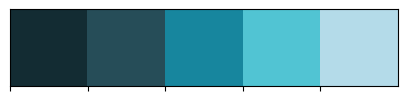

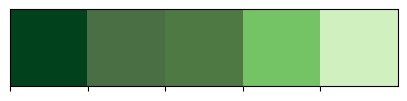

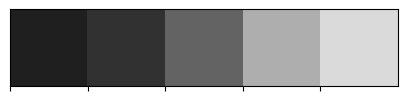

In [21]:
colors_blue = ["#132C33", "#264D58", '#17869E', '#51C4D3', '#B4DBE9']
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0']
sns.palplot(colors_blue)
sns.palplot(colors_green)
sns.palplot(colors_dark)
cm = sns.light_palette('green', as_cmap=True)

In [22]:
np.max(y_train)

36.183

### Model & Evaluate

In [23]:
def plot_prediction(model, model_name,X_train_input,X_test_input):
    y_pred_train = model.predict(X_train_input)
    y_pred_test = model.predict(X_test_input)
    plt.scatter(y_pred_train, y_train, c = colors_blue[2], label = "Training data",s = 10)
    plt.scatter(y_pred_test, y_test, c = colors_green[3], marker = "s", label = "Validation data",s=10)
    plt.title(f"Prediction with {model_name}")
    plt.xlabel("Predicted values")
    plt.ylabel("Real values")
    plt.legend(loc = "upper left")
    plt.plot([2, 40], [2, 40], c = "red")
    plt.show()
    y_head=model.predict(X_test_input)
    print('-'*10+model_name+'-'*10)
    print('R square Accuracy: ',r2_score(y_test,y_head))
    print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
    print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))
    
def cross_val(model,X_train_input):
    kfold = KFold(n_splits=5, shuffle=True)
    scoring = ['neg_mean_absolute_error','neg_mean_squared_error','r2']
    kf_cv_scores = cross_validate(model, X_train_input, y_train, cv=kfold, scoring=scoring)
    print("R2 Score average score: %.5f, std: %.5f" % (kf_cv_scores['test_r2'].mean(), kf_cv_scores['test_r2'].std()) )
    print("MAE average score: %.5f, std: %.5f" % (-kf_cv_scores['test_neg_mean_absolute_error'].mean(),kf_cv_scores['test_neg_mean_absolute_error'].std()))
    print("MSE average score: %.5f, std: %.5f" % (-kf_cv_scores['test_neg_mean_squared_error'].mean(), kf_cv_scores['test_neg_mean_squared_error'].std()))

#### XGB model

In [24]:
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)
y_head=xgb_reg.predict(X_test)
print('-'*10+'XGB'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------XGB----------
R square Accuracy:  0.9368660818070982
Mean Absolute Error Accuracy:  1.704239742501141
Mean Squared Error Accuracy:  6.374749538530829


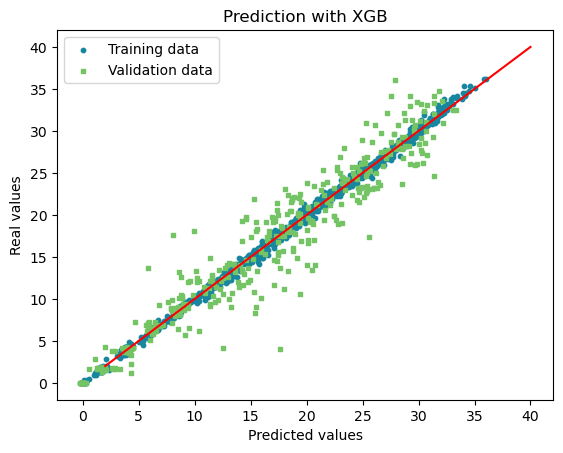

----------XGB----------
R square Accuracy:  0.9368660818070982
Mean Absolute Error Accuracy:  1.704239742501141
Mean Squared Error Accuracy:  6.374749538530829


In [25]:
plot_prediction(xgb_reg,"XGB",X_train,X_test)

#### SVM model

In [26]:
from sklearn.svm import SVR
svm = SVR(kernel = 'rbf',C=100)
svm.fit(X_train, y_train)
y_head=svm.predict(X_test)
print('-'*10+'svm'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------svm----------
R square Accuracy:  0.9173573322228239
Mean Absolute Error Accuracy:  1.844776257405428
Mean Squared Error Accuracy:  8.344584390688764


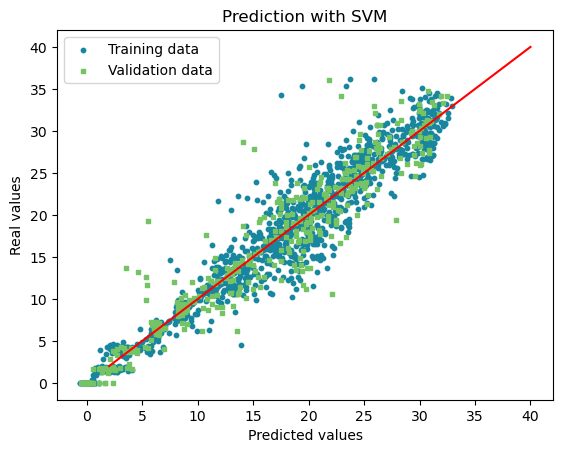

----------SVM----------
R square Accuracy:  0.9173573322228239
Mean Absolute Error Accuracy:  1.844776257405428
Mean Squared Error Accuracy:  8.344584390688764


In [27]:
plot_prediction(svm,"SVM",X_train,X_test)

In [23]:
import pickle
# save the model to disk
filename = 'model_svm.h5'
pickle.dump(svm, open(filename, 'wb'))

#### ANN model

In [29]:
!pip install tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 439.0/524.2 MB 1.1 MB/s eta 0:01:18^C
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━━━ 439.0/524.2 MB 1.1 MB/s eta 0:01:18
ERROR: Operation cancelled by user


In [28]:
# Using gridsearchCV to hyperparameter tunning
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_regression
from sklearn.model_selection import GridSearchCV

ModuleNotFoundError: No module named 'tensorflow'

Using gridsearchCV to find point optimize for ANN model

In [25]:
def make_regression_ann(hidden_unit1 = 12,hidden_unit2 = 24,initializer='normal', activation='relu', optimizer='adam', loss='mse'):

    model = Sequential()
    model.add(Dense(units=hidden_unit1, input_dim=X_off.shape[1], kernel_initializer=initializer, activation=activation))
    model.add(Dense(units=hidden_unit2, kernel_initializer=initializer, activation=activation))
    model.add(Dense(1, kernel_initializer=initializer))
    model.compile(loss=loss, optimizer=optimizer)

    return model

param_grid = {
    #hidden layer equal 2 => no tunning
    'hidden_unit1':[24],# run for 96 node and 192 node
    'hidden_unit2':[24],#run for 96 node and 192 node
    'epochs':[100]
}
# total 2^7
grid_search = GridSearchCV(
    estimator=KerasRegressor(make_regression_ann, verbose=0),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',#valuation with neg_mean_squared_error
    cv=3,
)

C:\Users\thanh\AppData\Local\Temp\ipykernel_10748\842836962.py:19: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  estimator=KerasRegressor(make_regression_ann, verbose=0),


In [26]:
X, y = make_regression(n_features=X_off.shape[1], n_samples=1, random_state=42)

In [27]:
grid_search.fit(X_train, y_train, verbose=1)

Epoch 1/100
35/35 [==============================] - 1s 3ms/step - loss: 319.0180
Epoch 2/100
35/35 [==============================] - 0s 3ms/step - loss: 312.4939
Epoch 3/100
35/35 [==============================] - 0s 3ms/step - loss: 284.6544
Epoch 4/100
35/35 [==============================] - 0s 3ms/step - loss: 212.8254
Epoch 5/100
35/35 [==============================] - 0s 3ms/step - loss: 112.8563
Epoch 6/100
35/35 [==============================] - 0s 2ms/step - loss: 53.5544
Epoch 7/100
35/35 [==============================] - 0s 2ms/step - loss: 43.6768
Epoch 8/100
35/35 [==============================] - 0s 2ms/step - loss: 42.1373
Epoch 9/100
35/35 [==============================] - 0s 2ms/step - loss: 41.0637
Epoch 10/100
35/35 [==============================] - 0s 2ms/step - loss: 40.4114
Epoch 11/100
35/35 [==============================] - 0s 2ms/step - loss: 39.8073
Epoch 12/100
35/35 [==============================] - 0s 2ms/step - loss: 39.1573
Epoch 13/100
35/35 [

GridSearchCV(cv=3,
             estimator=<keras.wrappers.scikit_learn.KerasRegressor object at 0x000001A0EAD03EE0>,
             param_grid={'epochs': [100], 'hidden_unit1': [24],
                         'hidden_unit2': [24]},
             scoring='neg_mean_squared_error')

In [28]:
y_head = grid_search.predict(X_test)
print('-'*10+'ANN'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------ANN----------
R square Accuracy:  0.7166748785745836
Mean Absolute Error Accuracy:  3.999487111910049
Mean Squared Error Accuracy:  28.6078662430289


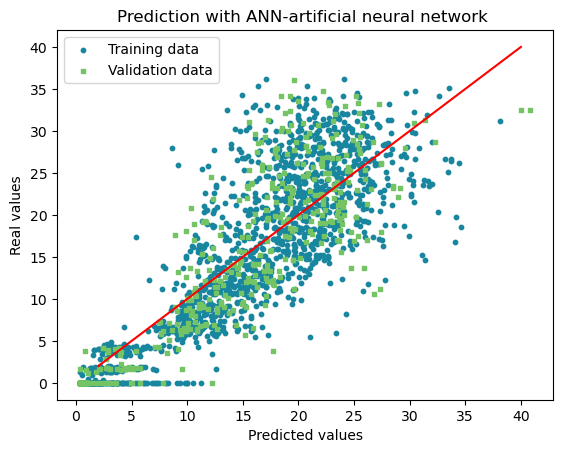

----------ANN-artificial neural network ----------
R square Accuracy:  0.7166748785745836
Mean Absolute Error Accuracy:  3.999487111910049
Mean Squared Error Accuracy:  28.6078662430289


In [29]:
plot_prediction(grid_search,"ANN-artificial neural network ",X_train,X_test)

#### ADA BOOST model

In [30]:
from sklearn.ensemble import AdaBoostRegressor
adb = AdaBoostRegressor()
adb.fit(X_train,y_train)
y_head=adb.predict(X_test)
print('-'*10+'ADABOOST'+'-'*10)
print('R square Accuracy: ',r2_score(y_test,y_head))
print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_head))
print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_head))

----------ADABOOST----------
R square Accuracy:  0.8898565396097202
Mean Absolute Error Accuracy:  2.3677500490438295
Mean Squared Error Accuracy:  11.121390741974666


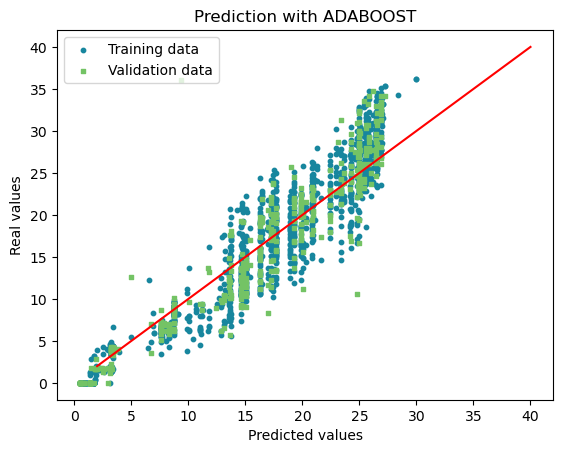

----------ADABOOST----------
R square Accuracy:  0.8898565396097202
Mean Absolute Error Accuracy:  2.3677500490438295
Mean Squared Error Accuracy:  11.121390741974666


In [31]:
plot_prediction(adb,"ADABOOST",X_train,X_test)

### Polynomial Mutiple Regression

##### Degree = 1

In [32]:
from sklearn.linear_model import SGDRegressor
sgd_reg = SGDRegressor(max_iter=10000,tol=3e-3, penalty=None, eta0=0.1)
sgd_reg.fit(X_train,y_train)

SGDRegressor(eta0=0.1, max_iter=10000, penalty=None, tol=0.003)

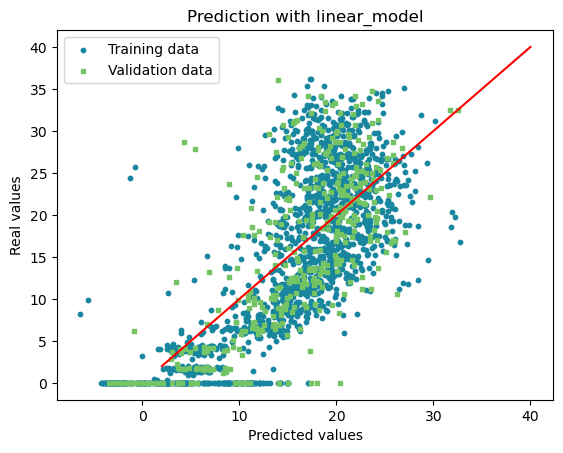

----------linear_model----------
R square Accuracy:  0.5343718360757034
Mean Absolute Error Accuracy:  5.414251594404174
Mean Squared Error Accuracy:  47.01534465252134


In [33]:
plot_prediction(sgd_reg,'linear_model',X_train,X_test)

In [34]:
print(' X0: {}\n X other : {}'.format(sgd_reg.intercept_,sgd_reg.coef_))

 X0: [14.85241771]
 X other : [ 0.0477983   1.6430576  -3.80867386  6.54928343  1.557652    0.65079198]


In [35]:
weight1 = sgd_reg.intercept_.tolist() + sgd_reg.coef_.tolist()# save weight of polynomial with degree = 1
weight1

[14.852417708548254,
 0.04779829648105749,
 1.6430576011992797,
 -3.80867386438939,
 6.549283426164313,
 1.557651995909769,
 0.6507919758613626]

##### Degree=2

In [36]:
from sklearn.preprocessing import PolynomialFeatures
poly_features = PolynomialFeatures(degree=2,include_bias=False)
X_poly = poly_features.fit_transform(X_train)

In [37]:
#preview & compare feature before and after transform polynomialFeature function 
print('---------feature before-----------:',X_train[0])
print('---------number feature of linear-----------:',len(X_train[0]))

print('---------poly_feature------:',X_poly[0])
print('---------number feature of polynomial degree = 2-----------:',len(X_poly[0]))

---------feature before-----------: [-0.29861163 -0.98819436  1.26209276 -1.67670535  1.19803659  0.40759868]
---------number feature of linear-----------: 6
---------poly_feature------: [-0.29861163 -0.98819436  1.26209276 -1.67670535  1.19803659  0.40759868
  0.08916891  0.29508633 -0.37687558  0.50068372 -0.35774766 -0.12171371
  0.9765281  -1.24719295  1.65691077 -1.183893   -0.40278672  1.59287813
 -2.11615768  1.5120333   0.51442735  2.81134083 -2.00875435 -0.68342289
  1.43529166  0.48831813  0.16613669]
---------number feature of polynomial degree = 2-----------: 27


In [38]:
from sklearn.linear_model import LinearRegression
lin_reg2 = LinearRegression()
lin_reg2.fit(X_poly,y_train)
# equation degree = 2
lin_reg2.intercept_,lin_reg2.coef_


(22.30180368635518,
 array([-2.86952778,  6.33726459, -2.74862789,  3.03821963,  0.40967237,
        -1.29470566,  0.11457461, -1.38444708,  0.80416071, -0.29282811,
        -0.41972255,  0.25236036, -5.26752409,  0.57381262,  1.91230879,
         0.06892018,  0.28788885, -0.4834452 , -1.55484451,  0.13582356,
         0.18487892, -3.14110693, -0.49182181, -0.66586145,  0.04338253,
         0.09071001,  0.09885245]))

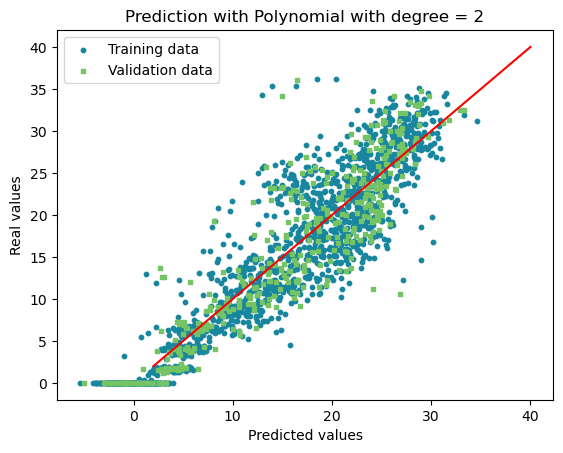

----------Polynomial with degree = 2----------
R square Accuracy:  0.8405953784054233
Mean Absolute Error Accuracy:  2.923519665264293
Mean Squared Error Accuracy:  16.095382118449873


In [39]:
X_poly_test= poly_features.transform(X_test)
plot_prediction(lin_reg2,'Polynomial with degree = 2',X_poly,X_poly_test)

In [40]:
cross_val(lin_reg2,X_poly)
# run model degree = 2 with 5 kfold

R2 Score average score: 0.85264, std: 0.00967
MAE average score: 2.88766, std: 0.07809
MSE average score: 15.54929, std: 0.87465


In [41]:
print('Number of variable X:',len(lin_reg2.coef_)+1)

Number of variable X: 28


In [42]:
lin_reg2.coef_

array([-2.86952778,  6.33726459, -2.74862789,  3.03821963,  0.40967237,
       -1.29470566,  0.11457461, -1.38444708,  0.80416071, -0.29282811,
       -0.41972255,  0.25236036, -5.26752409,  0.57381262,  1.91230879,
        0.06892018,  0.28788885, -0.4834452 , -1.55484451,  0.13582356,
        0.18487892, -3.14110693, -0.49182181, -0.66586145,  0.04338253,
        0.09071001,  0.09885245])

In [43]:
weight2 = [lin_reg2.intercept_]+ lin_reg2.coef_.tolist()# save weight of polynomial degree = 2
weight2

[22.30180368635518,
 -2.8695277768328906,
 6.337264594174622,
 -2.748627894648012,
 3.0382196287952423,
 0.4096723685822419,
 -1.2947056648800594,
 0.11457461127563284,
 -1.3844470794018007,
 0.8041607105565959,
 -0.2928281071686136,
 -0.4197225510175433,
 0.2523603600103217,
 -5.2675240887172,
 0.5738126227680013,
 1.9123087884570382,
 0.06892017526875377,
 0.2878888494859888,
 -0.4834451996338154,
 -1.5548445081423323,
 0.1358235606191021,
 0.18487891809253784,
 -3.141106932697971,
 -0.4918218053520241,
 -0.6658614459591595,
 0.0433825277190105,
 0.09071001335395155,
 0.09885244819734365]

##### degree = 3

In [44]:
poly_features = PolynomialFeatures(degree=3,include_bias=False)
X_poly = poly_features.fit_transform(X_train)
print(X_poly.shape)
lin_reg3 = LinearRegression()
lin_reg3.fit(X_poly,y_train)
# equation
lin_reg3.intercept_,lin_reg3.coef_
X_test_poly = poly_features.transform(X_test)
y_pre_ML_de3 = lin_reg3.predict(X_test_poly)


(1649, 83)


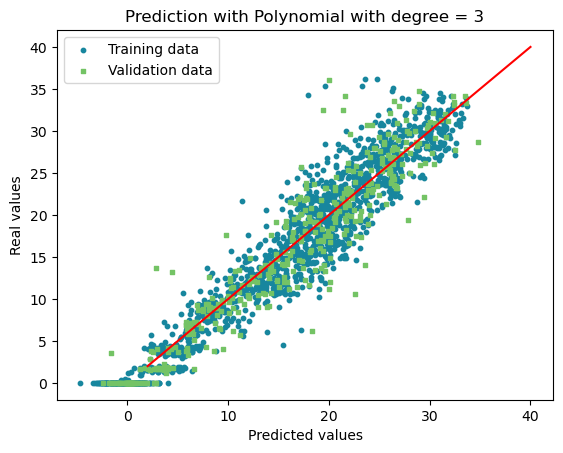

----------Polynomial with degree = 3----------
R square Accuracy:  0.89935985712753
Mean Absolute Error Accuracy:  2.2171979364383443
Mean Squared Error Accuracy:  10.161823037399975


In [45]:
X_poly_test= poly_features.transform(X_test)
plot_prediction(lin_reg3,'Polynomial with degree = 3',X_poly,X_poly_test)

In [46]:
cross_val(lin_reg3,X_poly)

R2 Score average score: 0.34080, std: 0.92566
MAE average score: 2.41214, std: 0.34512
MSE average score: 65.81514, std: 89.68995


In [47]:
print('Number of variable X:',len(lin_reg3.coef_)+1)

Number of variable X: 84


In [48]:
weight3 = [lin_reg3.intercept_]+lin_reg3.coef_.tolist()#save weight of poly degree = 3
weight3

[21.113956172764954,
 -5.6631293465485655,
 12.08336635546037,
 -4.173812882809882,
 0.2709500810317574,
 0.4467815582266048,
 -0.3690223403547821,
 1.0196778777666573,
 -4.197047837934912,
 0.9769408872121554,
 1.0856727583636543,
 -1.1601774057844738,
 0.32746109321121714,
 0.06334369044566379,
 1.7955717538762037,
 -2.904417371017683,
 -1.2020837778301179,
 1.762339495766882,
 -0.34155185009563155,
 1.0835315115428488,
 0.21909721531406928,
 0.4440283561359249,
 -1.7188111736395482,
 -0.03984949850483001,
 -1.6622802971736144,
 0.30165038448597503,
 -0.042591438007303306,
 0.19900204846443903,
 -0.07077841527478412,
 0.4128683857861001,
 -0.030095320722908436,
 -0.6422994961734289,
 -0.04654381759330173,
 -0.02130119658191676,
 0.5083508568608944,
 -0.026326505324863803,
 0.4319036110678268,
 0.7151222427339536,
 -0.6069473913815893,
 -0.025848433112861502,
 3.6330289717403694,
 0.8041700746502948,
 0.02428235415025265,
 -0.0015186432796113203,
 -0.4181144666750913,
 0.3564031412509

##### Degree = 4


In [49]:
poly_features = PolynomialFeatures(degree=4,include_bias=False)
X_poly = poly_features.fit_transform(X_train)
lin_reg4 = LinearRegression()
lin_reg4.fit(X_poly,y_train)
print('Equation degree = 4:')
lin_reg4.intercept_,lin_reg4.coef_


Equation degree = 4:


(21.959734170005706,
 array([-7.76626745e+00,  1.23441792e+01, -2.99394764e+00, -3.12913426e+00,
         6.31010334e-01, -1.89961117e+00,  3.35563518e+00, -4.69007296e+00,
         3.08186774e+00,  4.60466611e+00,  2.80088773e-01,  1.42943759e+00,
        -3.39811850e+00,  3.12316159e+00,  7.34453280e-01, -1.87737891e+00,
         2.50712757e+00, -7.13029573e-01,  1.67630440e+00,  1.71554919e-01,
        -8.69258302e-01,  2.17068377e+00,  3.34941232e+00, -1.41424802e-01,
         4.35003046e-01,  5.49565183e+00,  2.34981543e-01, -7.51465429e-01,
         7.88576837e-01, -1.48101958e+00, -4.27230379e+00,  4.18039855e-01,
         8.15734452e-01, -6.94669046e-02,  3.93221177e-01,  4.86558564e+00,
        -7.12768789e-01, -3.58037596e+00, -6.60179344e-01,  4.25525529e+00,
        -1.92854632e+00, -1.46974202e+00, -4.41939185e+00,  3.22852759e+00,
        -1.08374631e+00,  1.03783548e+00,  4.99648792e-01,  4.67351196e-02,
        -8.03000126e+00,  1.55545325e+00,  7.73154051e+00, -5.07027

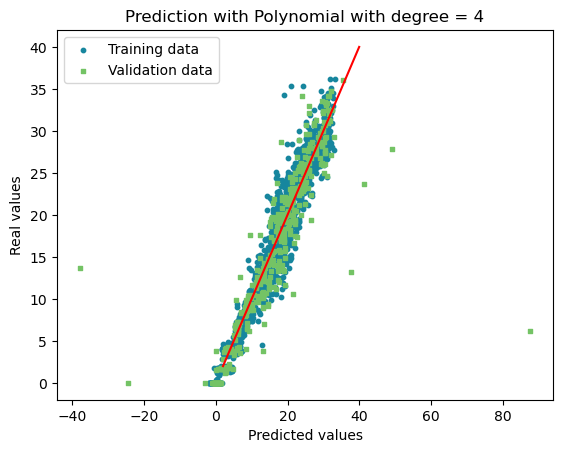

----------Polynomial with degree = 4----------
R square Accuracy:  0.6668039335231295
Mean Absolute Error Accuracy:  2.276468818246723
Mean Squared Error Accuracy:  33.643428632511586


In [50]:
X_poly_test= poly_features.transform(X_test)
plot_prediction(lin_reg4,'Polynomial with degree = 4',X_poly,X_poly_test)

In [51]:
weight4 = [lin_reg4.intercept_]+lin_reg4.coef_.tolist()
weight4

[21.959734170005706,
 -7.766267452871486,
 12.344179194370906,
 -2.9939476429418774,
 -3.1291342565781903,
 0.6310103342761099,
 -1.8996111685358572,
 3.3556351767597157,
 -4.690072960564913,
 3.0818677356244453,
 4.6046661084429505,
 0.28008877319006964,
 1.4294375892605078,
 -3.398118504786596,
 3.1231615867513796,
 0.7344532801137846,
 -1.8773789122309026,
 2.507127565831212,
 -0.7130295729562863,
 1.6763043968065818,
 0.1715549187591992,
 -0.8692583017799774,
 2.170683766983377,
 3.3494123214940843,
 -0.14142480208885902,
 0.4350030461543543,
 5.49565183018034,
 0.23498154294115137,
 -0.7514654287251195,
 0.7885768370721904,
 -1.4810195797699321,
 -4.2723037902850765,
 0.4180398554235592,
 0.815734451865376,
 -0.0694669045594127,
 0.39322117695431236,
 4.865585642484962,
 -0.7127687886204676,
 -3.5803759557411166,
 -0.6601793435548429,
 4.255255292445528,
 -1.9285463175269073,
 -1.469742018318559,
 -4.419391846777968,
 3.2285275856994957,
 -1.0837463055023893,
 1.0378354778268726,


#### Try Reducing dimention

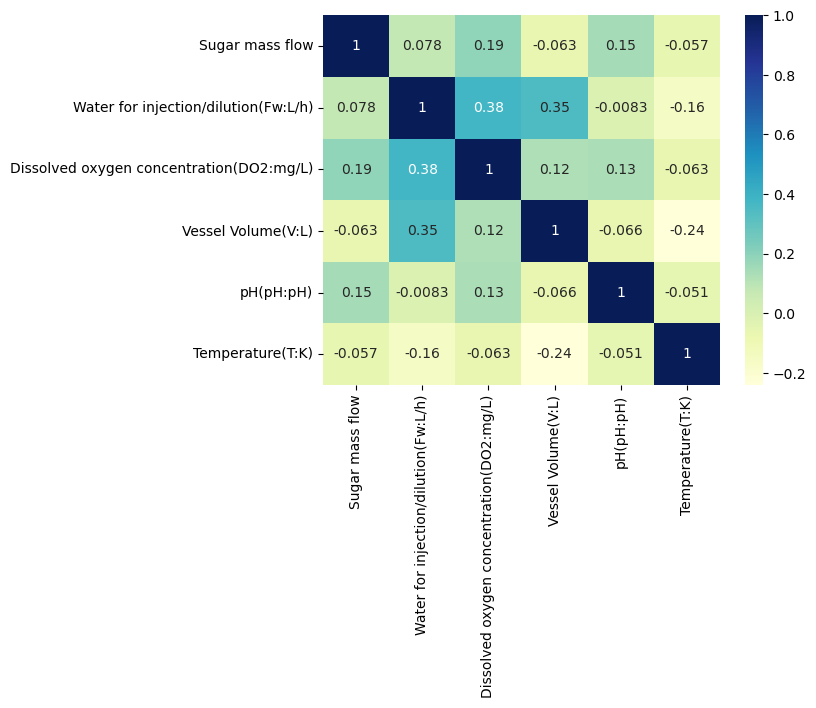

In [52]:
dataplot = sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)

## =>Can't reduce dimention


### Create function to predict new data by equation

y = w0+ w1x+ w2y+ w3z+ w4t+ w5g+ w6h+ w7x^2+ w8xy+ w9xz+ w10xt+ w11xg+ w12xh+ w13y^2+ w14yz+ w15yt+ w16yg+ w17yh+ w18z^2+ w19zt+ w20zg+ w21zh+ w22t^2+ w23tg+ w24th+ w25g^2+ w26gh+ w27h^2+ w28x^3+ w29x^2y+ w30x^2z+ w31x^2t+ w32x^2g+w33x^2h+ w34xy^2+ w35xyz+ w36xyt+ w37xyg+ w38xyh+w38xz^2+ w40xzt+ w41xzg+ w42xzh+ w43xt^2+ w44xtg+ w45xth+ w46xg^2+ w47xgh+ w48xh^2+ w49y^3+ w50y^2z+ w51y^2t+ w52y^2g+ w53y^2h+ w54yz^2+ w55yzt+ w56yzg+ w57yzh+ w58yt^2+w59ytg+ w60yth+ w61yg^2+ w62ygh+ w63yh^2+ w64z^3+ w65z^2t+ w66z^2g+ w67z^2h+ w68zt^2+ w69ztg+ w70zth+ w71zg^2+ w72zgh+ w73zh^2+w74t^3+ w75t^2g+ w76t^2h+ w77tg^2+ w78tgh+ w79th^2+ w80g^3+ w81g^2h+ w82gh^2+ w83h^3

In [53]:
def plot_prediction( weight,X_train,X_test,model_name,degree = 2):
    y_pred_train = X_train.dot(weight)
    y_pred_test = X_test.dot(weight)
    plt.scatter(y_pred_train, y_train, c = colors_blue[2], label = "Training data",s = 10)
    plt.scatter(y_pred_test, y_test, c = colors_green[3], marker = "s", label = "Validation data",s=10)
    plt.title(f"Prediction with {model_name}")
    plt.xlabel("Predicted values")
    plt.ylabel("Real values")
    plt.legend(loc = "upper left")
    plt.plot([2, 40], [2, 40], c = "red")
    plt.show()
    
    print('-'*10+model_name+'-'*10)
    print('R square Accuracy: ',r2_score(y_test,y_pred_test))
    print('Mean Absolute Error Accuracy: ',mean_absolute_error(y_test,y_pred_test))
    print('Mean Squared Error Accuracy: ',mean_squared_error(y_test,y_pred_test))
    return y_pred_test


In [54]:
def validation_equation(X_train,X_test,model_name,weight,degree=1):
    poly = PolynomialFeatures(degree=degree)
    X_train = poly.fit_transform(X_train)
    X_test = poly.transform(X_test)
    y_pre_test = plot_prediction(weight,X_train,X_test,model_name)
    print('==========Shape====',X_train.shape)
    # print('========Weight=====',weight)
    return y_pre_test
    
    

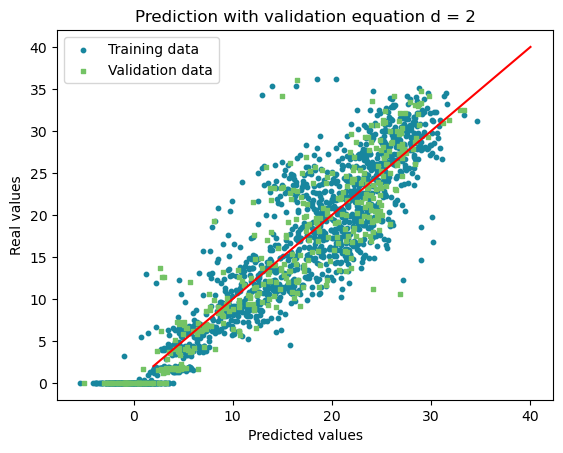

----------validation equation d = 2----------
R square Accuracy:  0.8405953784054232
Mean Absolute Error Accuracy:  2.923519665264293
Mean Squared Error Accuracy:  16.095382118449876
==========Shape==== (1649, 28)


array([25.86804377, 13.00894659,  1.76385265, 22.52804666, 23.90964783,
       10.0422315 , 25.10059989, 17.65234436, -5.01737087, 24.68796426,
       17.6676496 , 15.82444253, 18.62961919,  4.43865633, 10.67085727,
        1.39747526, 11.71440242, -2.19680113, 25.96435502,  1.0327772 ,
        7.69158948, 17.15470339,  8.85601366, 17.03005508, 12.29072103,
       25.33134034, 26.28013137, 19.46022754, 11.08375624, 21.41013745,
       21.65651208, 16.322745  , 14.72833736,  0.27943185,  5.85023149,
       19.79466972, 29.76024653, 14.12464628, 24.02437745, 27.04898522,
       11.84436229, 26.96089061, 13.29607981, 23.2798516 , 15.03580843,
       13.87578091,  4.62115758, 18.70168969,  3.6659189 , 26.72612   ,
       23.07849369,  9.99724497,  3.58102229,  4.77526866, -2.58894401,
       12.81369618, 21.4351847 , 14.35564781, -0.03396225,  0.56476109,
       23.51402191, 24.0995117 ,  2.0016866 , 28.1698322 ,  7.65563162,
       22.13252327, 23.919051  , 24.10049626, -0.86003484,  7.13

In [55]:
validation_equation(X_train,X_test,degree=2,model_name='validation equation d = 2',weight=weight2)

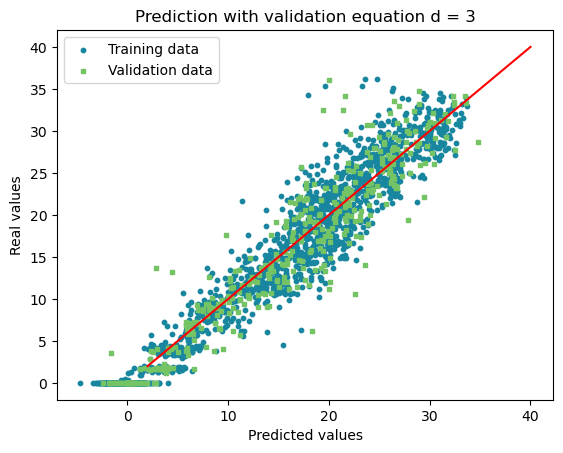

----------validation equation d = 3----------
R square Accuracy:  0.89935985712753
Mean Absolute Error Accuracy:  2.217197936438344
Mean Squared Error Accuracy:  10.161823037399975
==========Shape==== (1649, 84)


In [56]:
y_pre_equation_de3 = validation_equation(X_train,X_test,degree=3,model_name = 'validation equation d = 3',weight=weight3)

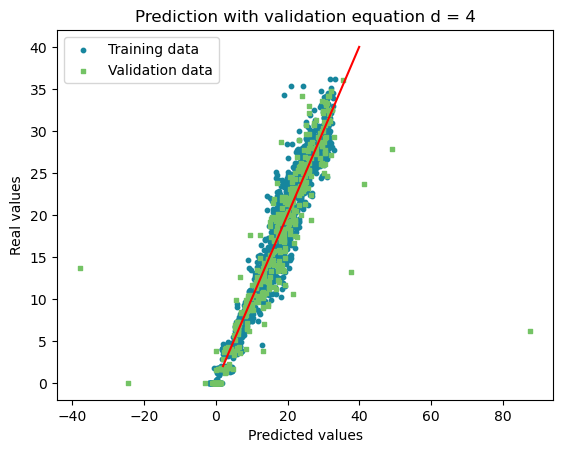

----------validation equation d = 4----------
R square Accuracy:  0.6668039335231294
Mean Absolute Error Accuracy:  2.2764688182467223
Mean Squared Error Accuracy:  33.6434286325116
==========Shape==== (1649, 210)


array([ 2.20795797e+01,  1.22537534e+01,  2.70028239e-02,  1.93173898e+01,
        1.81595590e+01,  8.73871514e+00,  2.79833441e+01,  2.04869659e+01,
        1.38574281e+00,  2.07822007e+01,  1.63419348e+01,  1.62596520e+01,
        1.62669750e+01,  2.19205931e+00,  8.32723032e+00,  9.75584148e-01,
        8.95304716e+00,  4.12754606e-01,  2.93282812e+01,  4.09039697e-01,
        8.03244329e+00,  1.53580634e+01,  6.92739993e+00,  1.59808250e+01,
        1.12525682e+01,  3.01562207e+01,  3.15903137e+01,  2.07204321e+01,
        1.00833054e+01,  1.81963803e+01,  1.88302115e+01,  1.47692323e+01,
        1.49380864e+01,  1.27884726e+00,  4.55927743e+00,  1.70461800e+01,
        3.11954191e+01,  2.26016450e+01,  2.95676748e+01,  2.98661450e+01,
        1.20096227e+01,  2.89785860e+01,  2.32306805e+01,  2.12315919e+01,
        2.38433177e+01,  1.72174914e+01,  6.13531719e+00,  1.66571498e+01,
        6.68007135e+00,  2.60068424e+01,  2.44138853e+01,  8.61312137e+00,
        2.34430070e+00,  

In [57]:
validation_equation(X_train,X_test,'validation equation d = 4',degree = 4,weight=weight4)

#### COMPARE 

In [58]:
compare = pd.DataFrame({'ML':y_pre_ML_de3,'Equation':y_pre_equation_de3,'Minus':np.around(y_pre_ML_de3 - y_pre_equation_de3)})
print('Minus between values ML and values equation:')
compare

Minus between values ML and values equation:


,ML,Equation,Minus
0,23.866518,23.866518,0.0
1,12.035747,12.035747,-0.0
2,0.429865,0.429865,0.0
3,20.513535,20.513535,0.0
4,34.818942,34.818942,0.0
...,...,...,...
408,4.292252,4.292252,0.0
409,19.199494,19.199494,0.0
410,3.845255,3.845255,0.0
411,11.119757,11.119757,0.0


In [59]:
compare.describe()

,ML,Equation,Minus
count,413.000000,413.000000,413.0
mean,15.254123,15.254123,0.0
std,9.559214,9.559214,0.0
min,-2.458618,-2.458618,0.0
25%,6.561866,6.561866,0.0
50%,16.476754,16.476754,0.0
75%,23.035196,23.035196,0.0
max,34.818942,34.818942,0.0


### DRAW COUNTER MAP

In [60]:
df.columns

Index(['Sugar mass flow', 'Water for injection/dilution(Fw:L/h)',
       'Dissolved oxygen concentration(DO2:mg/L)', 'Vessel Volume(V:L)',
       'pH(pH:pH)', 'Temperature(T:K)'],
      dtype='object')

In [61]:
df.describe()

,Sugar mass flow,Water for injection/dilution(Fw:L/h),Dissolved oxygen concentration(DO2:mg/L),Vessel Volume(V:L),pH(pH:pH),Temperature(T:K)
count,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000,2062.000000
mean,381.875771,153.128031,12.490602,72897.266731,6.498322,298.017328
std,1248.679407,154.994990,1.697908,8588.127217,0.070281,0.178337
min,0.004620,0.000000,4.030400,56550.000000,5.451500,297.430000
25%,0.092788,0.000000,11.516250,65348.250000,6.492500,297.950000
50%,0.122133,100.000000,12.581500,75418.500000,6.500500,297.990000
75%,2.434050,250.000000,13.713750,79499.750000,6.508100,298.040000
max,12995.775000,500.000000,16.139000,92671.000000,6.746700,301.110000


In [62]:
df_test = df.loc[(df['pH(pH:pH)'] >= 6.3) & (df['pH(pH:pH)']<= 6.8)]
df_test.describe()

,Sugar mass flow,Water for injection/dilution(Fw:L/h),Dissolved oxygen concentration(DO2:mg/L),Vessel Volume(V:L),pH(pH:pH),Temperature(T:K)
count,2043.000000,2043.000000,2043.000000,2043.000000,2043.000000,2043.000000
mean,385.426192,152.667646,12.480078,72823.204112,6.503506,298.017602
std,1253.929545,154.729490,1.695843,8578.312168,0.038938,0.179026
min,0.004620,0.000000,4.030400,56550.000000,6.341300,297.430000
25%,0.092815,0.000000,11.512500,64386.500000,6.492900,297.950000
50%,0.122304,100.000000,12.569000,75369.000000,6.500600,297.990000
75%,2.482275,250.000000,13.697000,79477.500000,6.508200,298.040000
max,12995.775000,500.000000,16.139000,92671.000000,6.746700,301.110000


In [63]:
6.754654654

6.754654654

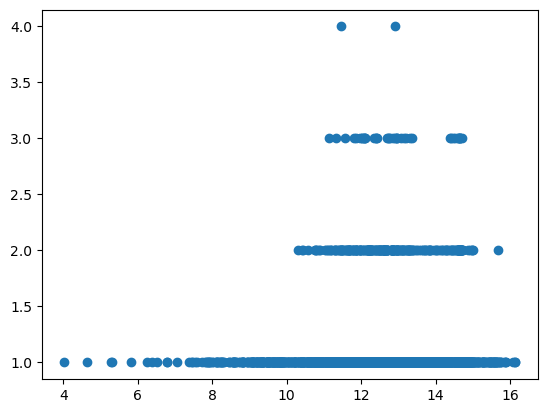

In [64]:
fig, ax = plt.subplots()
plt.scatter(df_test['Dissolved oxygen concentration(DO2:mg/L)'].value_counts().index,df_test['Dissolved oxygen concentration(DO2:mg/L)'].value_counts().values)

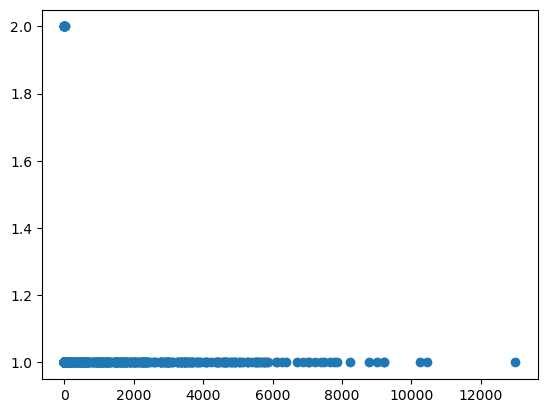

In [65]:
fig, ax = plt.subplots()
plt.scatter(df_test['Sugar mass flow'].value_counts().index,df_test['Sugar mass flow'].value_counts().values)

In [66]:
from statistics import mode
mode(df['Water for injection/dilution(Fw:L/h)'])

0.0

In [67]:
df['Water for injection/dilution(Fw:L/h)'].value_counts()

0.0      616
100.0    605
250.0    341
500.0    200
150.0    200
400.0    100
Name: Water for injection/dilution(Fw:L/h), dtype: int64

In [68]:
df['pH(pH:pH)'].value_counts()

6.4998    15
6.5017    15
6.4968    13
6.5051    13
6.4938    12
          ..
6.4887     1
6.4109     1
6.6536     1
6.3942     1
6.6416     1
Name: pH(pH:pH), Length: 739, dtype: int64

In [69]:
df_test2 = df.loc[(df['Water for injection/dilution(Fw:L/h)']==100) & (df['pH(pH:pH)']==6.4938)]
df_test2.describe()

,Sugar mass flow,Water for injection/dilution(Fw:L/h),Dissolved oxygen concentration(DO2:mg/L),Vessel Volume(V:L),pH(pH:pH),Temperature(T:K)
count,1.000000,1.0,1.000,1.0,1.0000,1.00
mean,0.129735,100.0,12.377,80162.0,6.4938,297.97
std,NaN,NaN,NaN,NaN,NaN,NaN
min,0.129735,100.0,12.377,80162.0,6.4938,297.97
25%,0.129735,100.0,12.377,80162.0,6.4938,297.97
50%,0.129735,100.0,12.377,80162.0,6.4938,297.97
75%,0.129735,100.0,12.377,80162.0,6.4938,297.97
max,0.129735,100.0,12.377,80162.0,6.4938,297.97


In [70]:
mode(df['Dissolved oxygen concentration(DO2:mg/L)'])

12.905

In [71]:
df_test2['Dissolved oxygen concentration(DO2:mg/L)'].value_counts()

12.377    1
Name: Dissolved oxygen concentration(DO2:mg/L), dtype: int64

In [72]:
df_test3 = df_test2[df_test2['Sugar mass flow']==9.28]
df_test3.describe()

,Sugar mass flow,Water for injection/dilution(Fw:L/h),Dissolved oxygen concentration(DO2:mg/L),Vessel Volume(V:L),pH(pH:pH),Temperature(T:K)
count,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN


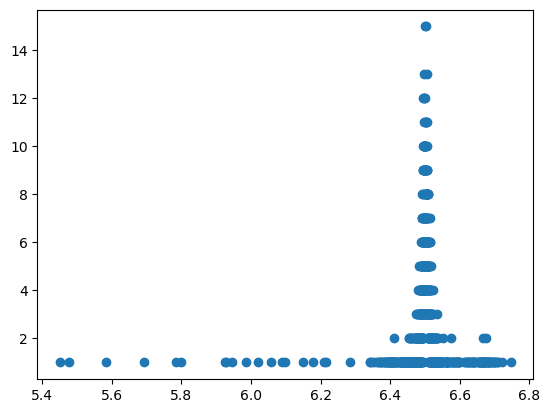

In [73]:
fig, ax = plt.subplots()
plt.scatter(df['pH(pH:pH)'].value_counts().index,df['pH(pH:pH)'].value_counts().values)

In [77]:

df['Dissolved oxygen concentration(DO2:mg/L)'].value_counts().iloc[0:40]



12.905    4
11.467    4
13.154    3
12.334    3
14.384    3
14.631    3
14.704    3
13.364    3
12.015    3
12.407    3
12.436    3
12.854    3
14.644    3
13.074    3
12.756    3
14.613    3
12.713    3
14.526    3
12.113    3
14.652    3
11.147    3
11.800    3
12.028    3
14.407    3
13.301    3
12.106    3
12.075    3
14.473    3
14.648    3
12.959    3
12.692    3
12.946    3
12.078    3
11.328    3
11.568    3
12.772    3
12.916    3
12.969    3
11.860    3
13.206    3
Name: Dissolved oxygen concentration(DO2:mg/L), dtype: int64

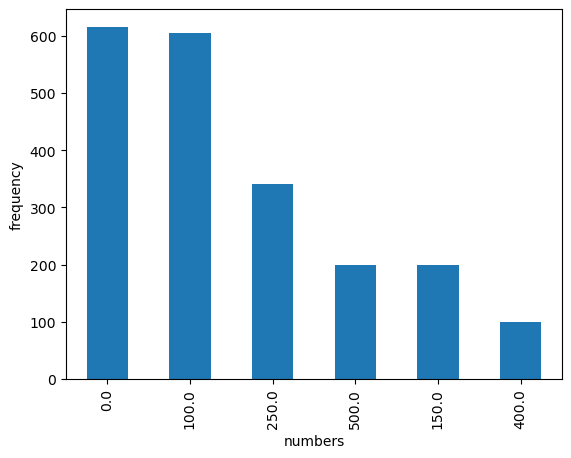

In [75]:
fig, ax = plt.subplots()
df['Water for injection/dilution(Fw:L/h)'].value_counts().plot(ax=ax, kind='bar', xlabel='numbers', ylabel='frequency')
plt.show()

In [95]:
def counter_plot(x_axis = 'Sugar_mass_flow',y_axis = 'Vessel_Volume', Sugar_mass_flow=[0,8000],
                 Dissolved_oxygen_concentration = 12.905,Vessel_Volume=61177,pH = [6.3,6.8]):
    vs = np .array([0,100,250,500]) #Water for injection/dilution(Fw:L/h)
    us = np.array([297,298,300])  #Temperature(T:K)
    x_len, y_len = 100, 100        
    dis = [Dissolved_oxygen_concentration]*100
    sug = np.linspace(Sugar_mass_flow[0],Sugar_mass_flow[1], y_len)
    ve = [Vessel_Volume]*100#+[14]*20
    # Reac = np.zeros(100)
    ph = np.linspace(pH[0],pH[1], y_len)#
   
    fig, axs = plt.subplots(nrows=4, ncols=3,      
                            sharex=True, sharey=True,   
                            clear=True,        
                            figsize=(15, 10))  

    for ax, v in zip(axs, vs): #vs Water for injection/dilution(Fw:L/h),axs : biểu đồ 
        count=0
        ax[0].set_ylabel('Water = '+str(v)+'\npH', size='large', ha='right', labelpad = 5)
        
        for u in us:# us: Temp
            if v == 0:
                ax[count].set_title("Temperature = " + str(u) + "°C")
            if v == 500:
                ax[count].set_xlabel('Sugar', size='large', ha='right', labelpad = 5)
            # ax[count].set_ylabel('RPM', size='large', ha='right', labelpad = 5)
            
            SUG_m,PH_m = np.meshgrid(sug,ph)#sug create 100 line (and 10000 points) for pet and ph
            ve_m = ve*np.ones_like(SUG_m)# create the same size of sug
            dis_m = dis*np.ones_like(SUG_m)# create the same size of sug
            
            vm = v * np.ones_like(SUG_m)
            um = u * np.ones_like(SUG_m)
            r = np.c_[SUG_m.flatten(),vm.flatten(), dis_m.flatten(), ve_m.flatten(),PH_m.flatten(),um.flatten()]
            df_r = pd.DataFrame(data=r)
            print(df_r.describe())
            r = scaled.transform(r)
            print('===========r==============')
            # r become database with 10000 line and with the columns name above (all features)
            poly = PolynomialFeatures(degree=3)
            c = poly.fit_transform(r)
            print(c.shape)
            c = c.dot(weight3).reshape(x_len, y_len)
    
        
            cmap = ax[count].contour(SUG_m, PH_m, c, vmin=0, vmax = np.max(c), cmap='gray_r')# for loop Water for injection/dilution(Fw:L/h) and for loop temp
            # finish loop we get 12 sub charts
            plt.clabel(cmap, inline=1, fontsize=13)
            pmap = ax[count].pcolormesh(SUG_m, PH_m, c, 
                        shading='gouraud',
                        vmin=0, vmax=40, 
                        cmap='viridis')

            count += 1

    plt.tight_layout()
    plt.colorbar(pmap, ax=axs, fraction=0.05)
    plt.savefig('.\img_equation\\'+str(Dissolved_oxygen_concentration)+'_'+str(Vessel_Volume)+'.png')
    plt.show()

                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000      0.0  1.290500e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145796      0.0
min        0.00000      0.0  1.290500e+01  61177.0      6.300000    297.0
25%     2000.00000      0.0  1.290500e+01  61177.0      6.425000    297.0
50%     4000.00000      0.0  1.290500e+01  61177.0      6.550000    297.0
75%     6000.00000      0.0  1.290500e+01  61177.0      6.675000    297.0
max     8000.00000      0.0  1.290500e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000      0.0  1.290500e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.290500e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145796      0.0
min        0.00000    100.0  1.290500e+01  61177.0      6.300000    297.0
25%     2000.00000    100.0  1.290500e+01  61177.0      6.425000    297.0
50%     4000.00000    100.0  1.290500e+01  61177.0      6.550000    297.0
75%     6000.00000    100.0  1.290500e+01  61177.0      6.675000    297.0
max     8000.00000    100.0  1.290500e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.290500e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.290500e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145796      0.0
min        0.00000    100.0  1.290500e+01  61177.0      6.300000    300.0
25%     2000.00000    100.0  1.290500e+01  61177.0      6.425000    300.0
50%     4000.00000    100.0  1.290500e+01  61177.0      6.550000    300.0
75%     6000.00000    100.0  1.290500e+01  61177.0      6.675000    300.0
max     8000.00000    100.0  1.290500e+01  61177.0      6.800000    300.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.290500e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.290500e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145796      0.0
min        0.00000    250.0  1.290500e+01  61177.0      6.300000    298.0
25%     2000.00000    250.0  1.290500e+01  61177.0      6.425000    298.0
50%     4000.00000    250.0  1.290500e+01  61177.0      6.550000    298.0
75%     6000.00000    250.0  1.290500e+01  61177.0      6.675000    298.0
max     8000.00000    250.0  1.290500e+01  61177.0      6.800000    298.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.290500e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    500.0  1.290500e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145796      0.0
min        0.00000    500.0  1.290500e+01  61177.0      6.300000    297.0
25%     2000.00000    500.0  1.290500e+01  61177.0      6.425000    297.0
50%     4000.00000    500.0  1.290500e+01  61177.0      6.550000    297.0
75%     6000.00000    500.0  1.290500e+01  61177.0      6.675000    297.0
max     8000.00000    500.0  1.290500e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    500.0  1.290500e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  9.788216e-13      0.0      0.145796      0.0

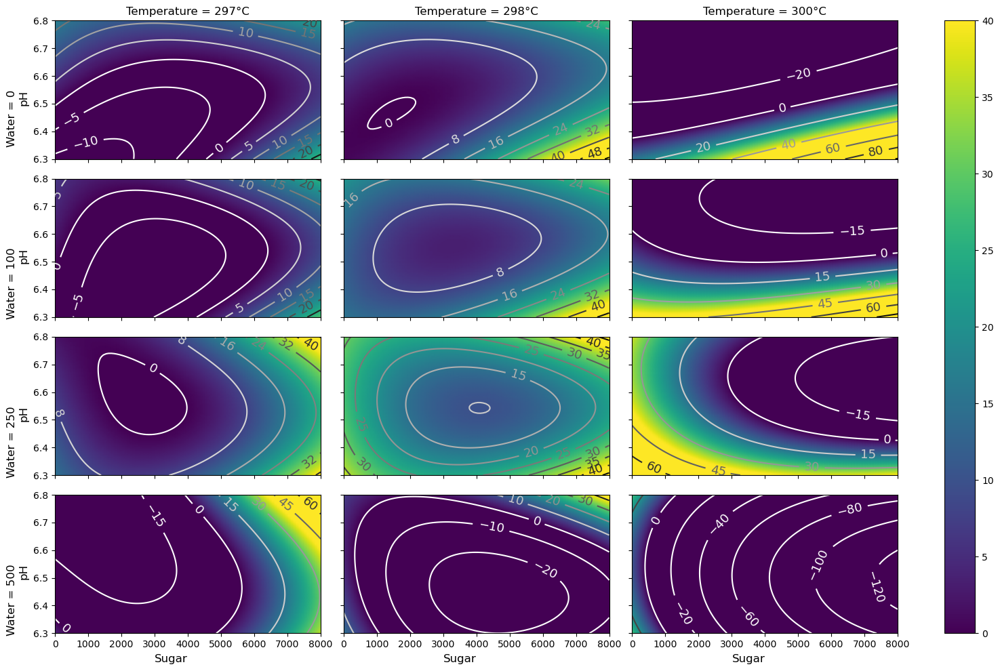

                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000      0.0  1.146700e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  1.021456e-12      0.0      0.145796      0.0
min        0.00000      0.0  1.146700e+01  61177.0      6.300000    297.0
25%     2000.00000      0.0  1.146700e+01  61177.0      6.425000    297.0
50%     4000.00000      0.0  1.146700e+01  61177.0      6.550000    297.0
75%     6000.00000      0.0  1.146700e+01  61177.0      6.675000    297.0
max     8000.00000      0.0  1.146700e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000      0.0  1.146700e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  1.021456e-12      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.146700e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  1.021456e-12      0.0      0.145796      0.0
min        0.00000    100.0  1.146700e+01  61177.0      6.300000    300.0
25%     2000.00000    100.0  1.146700e+01  61177.0      6.425000    300.0
50%     4000.00000    100.0  1.146700e+01  61177.0      6.550000    300.0
75%     6000.00000    100.0  1.146700e+01  61177.0      6.675000    300.0
max     8000.00000    100.0  1.146700e+01  61177.0      6.800000    300.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.146700e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  1.021

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.146700e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  1.021456e-12      0.0      0.145796      0.0
min        0.00000    250.0  1.146700e+01  61177.0      6.300000    300.0
25%     2000.00000    250.0  1.146700e+01  61177.0      6.425000    300.0
50%     4000.00000    250.0  1.146700e+01  61177.0      6.550000    300.0
75%     6000.00000    250.0  1.146700e+01  61177.0      6.675000    300.0
max     8000.00000    250.0  1.146700e+01  61177.0      6.800000    300.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    500.0  1.146700e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  1.021456e-12      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    500.0  1.146700e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  1.021456e-12      0.0      0.145796      0.0
min        0.00000    500.0  1.146700e+01  61177.0      6.300000    300.0
25%     2000.00000    500.0  1.146700e+01  61177.0      6.425000    300.0
50%     4000.00000    500.0  1.146700e+01  61177.0      6.550000    300.0
75%     6000.00000    500.0  1.146700e+01  61177.0      6.675000    300.0
max     8000.00000    500.0  1.146700e+01  61177.0      6.800000    300.0
===========r==============
(10000, 84)


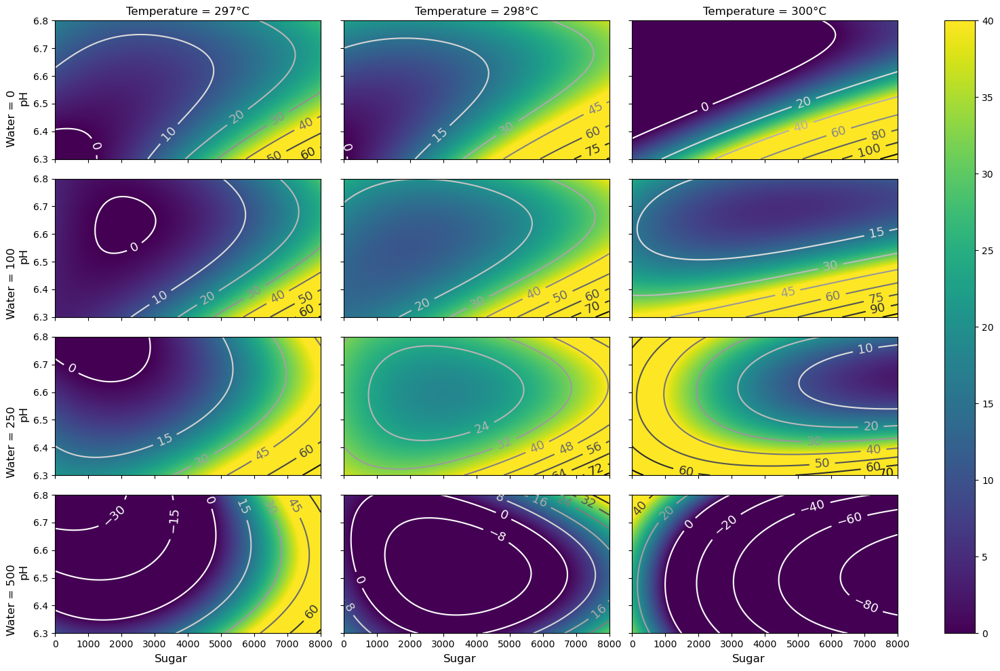

                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000      0.0  1.315400e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  2.023372e-12      0.0      0.145796      0.0
min        0.00000      0.0  1.315400e+01  61177.0      6.300000    297.0
25%     2000.00000      0.0  1.315400e+01  61177.0      6.425000    297.0
50%     4000.00000      0.0  1.315400e+01  61177.0      6.550000    297.0
75%     6000.00000      0.0  1.315400e+01  61177.0      6.675000    297.0
max     8000.00000      0.0  1.315400e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000      0.0  1.315400e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  2.023372e-12      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.315400e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  2.023372e-12      0.0      0.145796      0.0
min        0.00000    100.0  1.315400e+01  61177.0      6.300000    297.0
25%     2000.00000    100.0  1.315400e+01  61177.0      6.425000    297.0
50%     4000.00000    100.0  1.315400e+01  61177.0      6.550000    297.0
75%     6000.00000    100.0  1.315400e+01  61177.0      6.675000    297.0
max     8000.00000    100.0  1.315400e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.315400e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  2.023372e-12      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.315400e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  2.023372e-12      0.0      0.145796      0.0
min        0.00000    100.0  1.315400e+01  61177.0      6.300000    300.0
25%     2000.00000    100.0  1.315400e+01  61177.0      6.425000    300.0
50%     4000.00000    100.0  1.315400e+01  61177.0      6.550000    300.0
75%     6000.00000    100.0  1.315400e+01  61177.0      6.675000    300.0
max     8000.00000    100.0  1.315400e+01  61177.0      6.800000    300.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.315400e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  2.023372e-12      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.315400e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  2.023372e-12      0.0      0.145796      0.0
min        0.00000    250.0  1.315400e+01  61177.0      6.300000    300.0
25%     2000.00000    250.0  1.315400e+01  61177.0      6.425000    300.0
50%     4000.00000    250.0  1.315400e+01  61177.0      6.550000    300.0
75%     6000.00000    250.0  1.315400e+01  61177.0      6.675000    300.0
max     8000.00000    250.0  1.315400e+01  61177.0      6.800000    300.0


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    500.0  1.315400e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  2.023372e-12      0.0      0.145796      0.0
min        0.00000    500.0  1.315400e+01  61177.0      6.300000    297.0
25%     2000.00000    500.0  1.315400e+01  61177.0      6.425000    297.0
50%     4000.00000    500.0  1.315400e+01  61177.0      6.550000    297.0
75%     6000.00000    500.0  1.315400e+01  61177.0      6.675000    297.0
max     8000.00000    500.0  1.315400e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    500.0  1.315400e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  2.023

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


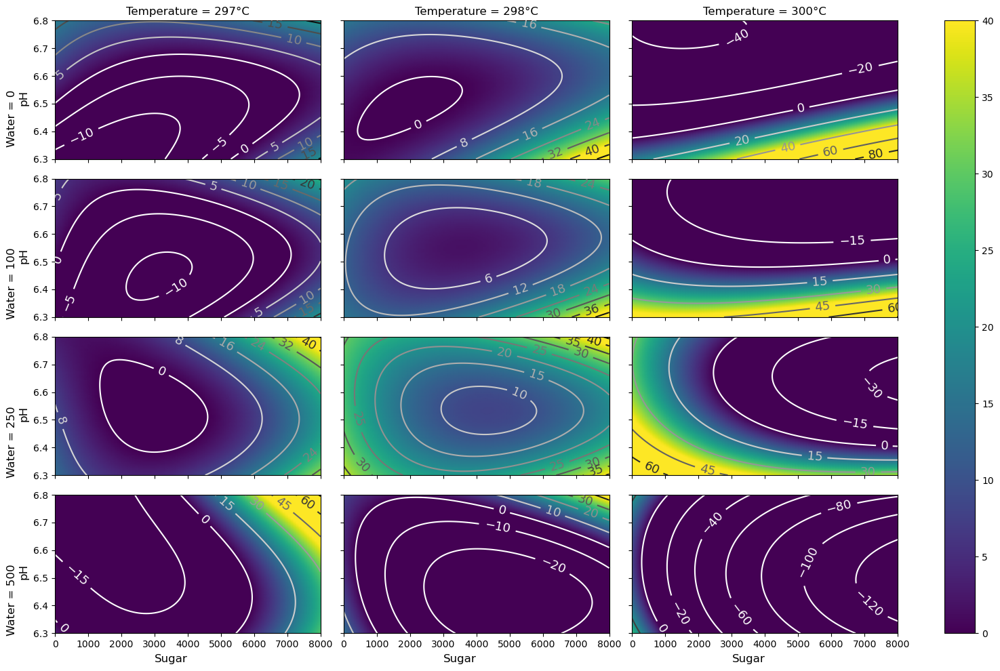

                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000      0.0  1.233400e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145796      0.0
min        0.00000      0.0  1.233400e+01  61177.0      6.300000    297.0
25%     2000.00000      0.0  1.233400e+01  61177.0      6.425000    297.0
50%     4000.00000      0.0  1.233400e+01  61177.0      6.550000    297.0
75%     6000.00000      0.0  1.233400e+01  61177.0      6.675000    297.0
max     8000.00000      0.0  1.233400e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000      0.0  1.233400e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.233400e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145796      0.0
min        0.00000    100.0  1.233400e+01  61177.0      6.300000    297.0
25%     2000.00000    100.0  1.233400e+01  61177.0      6.425000    297.0
50%     4000.00000    100.0  1.233400e+01  61177.0      6.550000    297.0
75%     6000.00000    100.0  1.233400e+01  61177.0      6.675000    297.0
max     8000.00000    100.0  1.233400e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    100.0  1.233400e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.233400e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145796      0.0
min        0.00000    250.0  1.233400e+01  61177.0      6.300000    297.0
25%     2000.00000    250.0  1.233400e+01  61177.0      6.425000    297.0
50%     4000.00000    250.0  1.233400e+01  61177.0      6.550000    297.0
75%     6000.00000    250.0  1.233400e+01  61177.0      6.675000    297.0
max     8000.00000    250.0  1.233400e+01  61177.0      6.800000    297.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.233400e+01  61177.0      6.550000    298.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    250.0  1.233400e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145796      0.0
min        0.00000    250.0  1.233400e+01  61177.0      6.300000    300.0
25%     2000.00000    250.0  1.233400e+01  61177.0      6.425000    300.0
50%     4000.00000    250.0  1.233400e+01  61177.0      6.550000    300.0
75%     6000.00000    250.0  1.233400e+01  61177.0      6.675000    300.0
max     8000.00000    250.0  1.233400e+01  61177.0      6.800000    300.0
===========r==============
(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    500.0  1.233400e+01  61177.0      6.550000    297.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145796      0.0

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


(10000, 84)
                 0        1             2        3             4        5
count  10000.00000  10000.0  1.000000e+04  10000.0  10000.000000  10000.0
mean    4000.00000    500.0  1.233400e+01  61177.0      6.550000    300.0
std     2332.72836      0.0  1.778222e-12      0.0      0.145796      0.0
min        0.00000    500.0  1.233400e+01  61177.0      6.300000    300.0
25%     2000.00000    500.0  1.233400e+01  61177.0      6.425000    300.0
50%     4000.00000    500.0  1.233400e+01  61177.0      6.550000    300.0
75%     6000.00000    500.0  1.233400e+01  61177.0      6.675000    300.0
max     8000.00000    500.0  1.233400e+01  61177.0      6.800000    300.0
===========r==============
(10000, 84)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


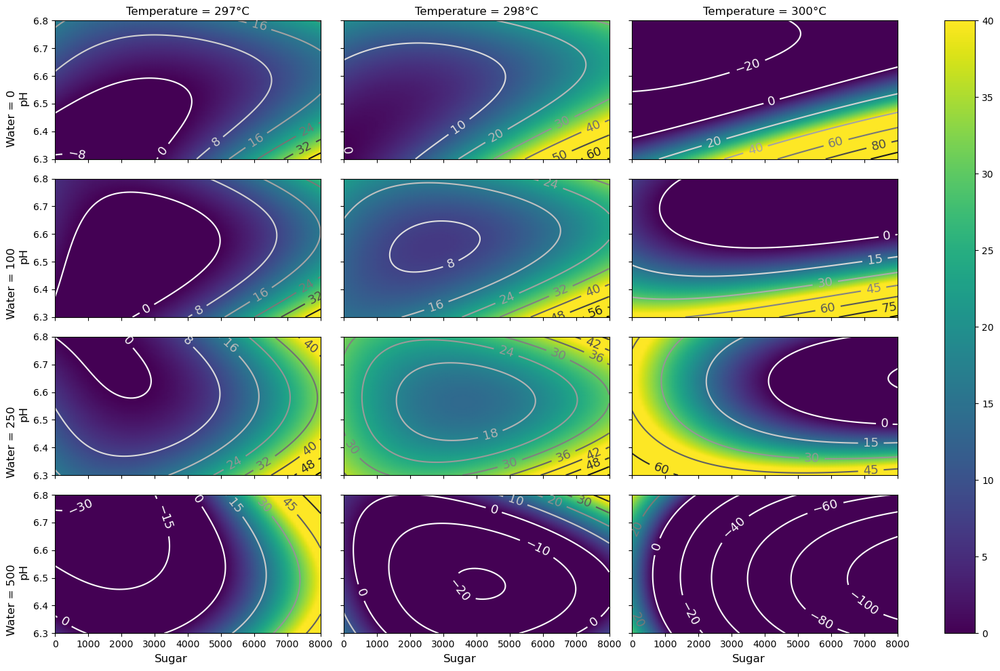

In [96]:
for i in [12.905,11.467,13.154,12.334]:
    for j in [61177]:
        counter_plot(Dissolved_oxygen_concentration=i,Vessel_Volume=j)
        break

#### with ML

In [97]:
# def counter_plot(x_axis = 'Sugar_mass_flow',y_axis = 'Vessel_Volume', Sugar_mass_flow=[0,2.43],
#                  Dissolved_oxygen_concentration = 4,Vessel_Volume=61177,pH = [6.3,6.8]):
def counter_plot_ML(x_axis = 'Sugar_mass_flow',y_axis = 'Vessel_Volume', Sugar_mass_flow=[0,8000],
                 Dissolved_oxygen_concentration = 12.905,Vessel_Volume=61177,pH = [6.3,6.8]):
    vs = np .array([0,100,250,500]) #Water for injection/dilution(Fw:L/h)
    us = np.array([297,298,300])  #Temperature(T:K)
    x_len, y_len = 100, 100        
    dis = [Dissolved_oxygen_concentration]*100
    sug = np.linspace(Sugar_mass_flow[0],Sugar_mass_flow[1], y_len)
    ve = [Vessel_Volume]*100#+[14]*20
    # Reac = np.zeros(100)
    ph = np.linspace(pH[0],pH[1], y_len)#
   
    fig, axs = plt.subplots(nrows=4, ncols=3,      
                            sharex=True, sharey=True,   
                            clear=True,        
                            figsize=(15, 10))  

    for ax, v in zip(axs, vs): #vs Water for injection/dilution(Fw:L/h),axs : biểu đồ 
        count=0
        ax[0].set_ylabel('Water = '+str(v)+'\npH', size='large', ha='right', labelpad = 5)
        
        for u in us:# us: Temp
            if v == 0:
                ax[count].set_title("Temperature = " + str(u) + "°C")
            if v == 500:
                ax[count].set_xlabel('Sugar', size='large', ha='right', labelpad = 5)
            # ax[count].set_ylabel('RPM', size='large', ha='right', labelpad = 5)
            
            SUG_m,PH_m = np.meshgrid(sug,ph)#sug create 100 line (and 10000 points) for pet and ph
            ve_m = ve*np.ones_like(SUG_m)# create the same size of sug
            dis_m = dis*np.ones_like(SUG_m)# create the same size of sug
            
            vm = v * np.ones_like(SUG_m)
            um = u * np.ones_like(SUG_m)
            r = np.c_[SUG_m.flatten(),vm.flatten(), dis_m.flatten(), ve_m.flatten(),PH_m.flatten(),um.flatten()]
           
            r = scaled.transform(r)
            print('===========r==============')
            # r become database with 10000 line and with the columns name above (all features)
            poly = PolynomialFeatures(degree=3,include_bias=False)
            c = poly.fit_transform(r)
            print(c.shape)
            c = lin_reg3.predict(c).reshape(x_len, y_len)
    
        
            cmap = ax[count].contour(SUG_m, PH_m, c, vmin=0, vmax = np.max(c), cmap='gray_r')# for loop Water for injection/dilution(Fw:L/h) and for loop temp
            # finish loop we get 12 sub charts
            plt.clabel(cmap, inline=1, fontsize=13)
            pmap = ax[count].pcolormesh(SUG_m, PH_m, c, 
                        shading='gouraud',
                        vmin=0, vmax=40, 
                        cmap='viridis')
            count += 1

    plt.tight_layout()
    plt.colorbar(pmap, ax=axs, fraction=0.05)
    plt.savefig('.\img_ML\\'+str(Dissolved_oxygen_concentration)+'_'+str(Vessel_Volume)+'.png')
    plt.show()

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)


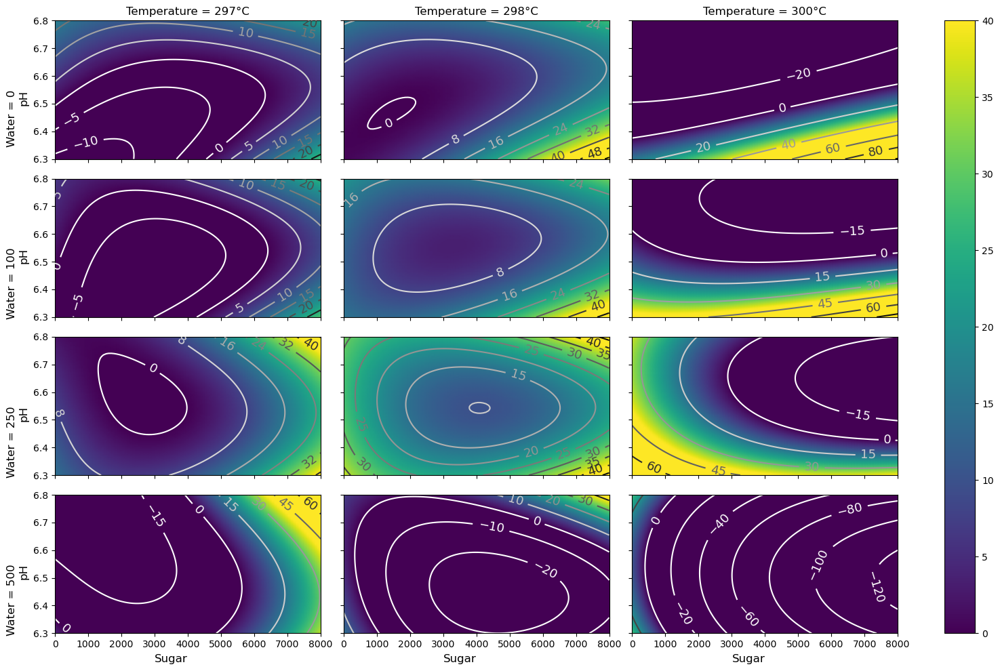

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid f

===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid f

===========r==============
(10000, 83)


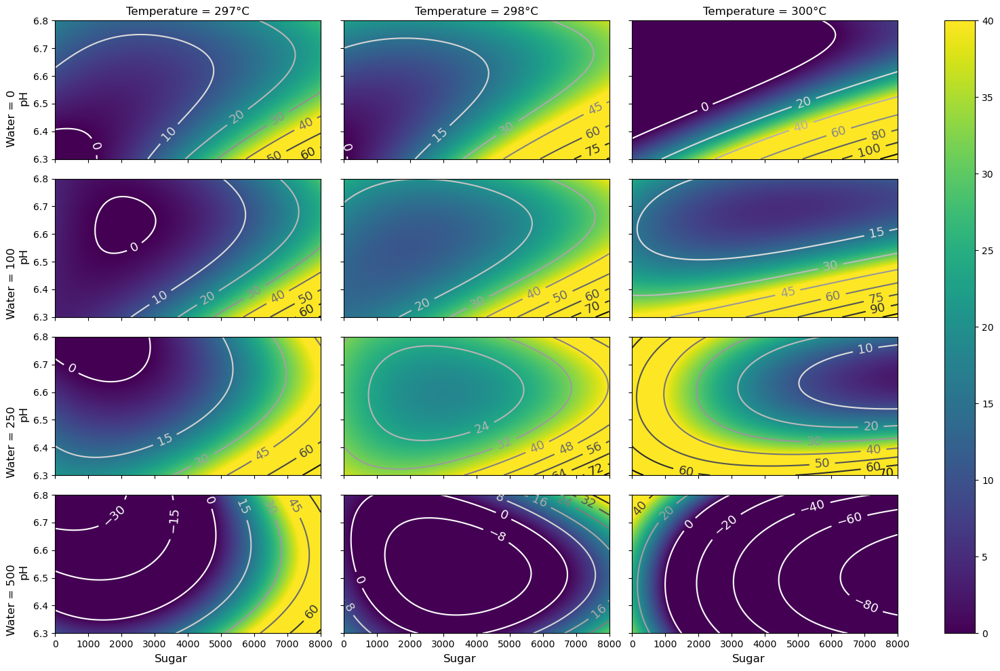

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


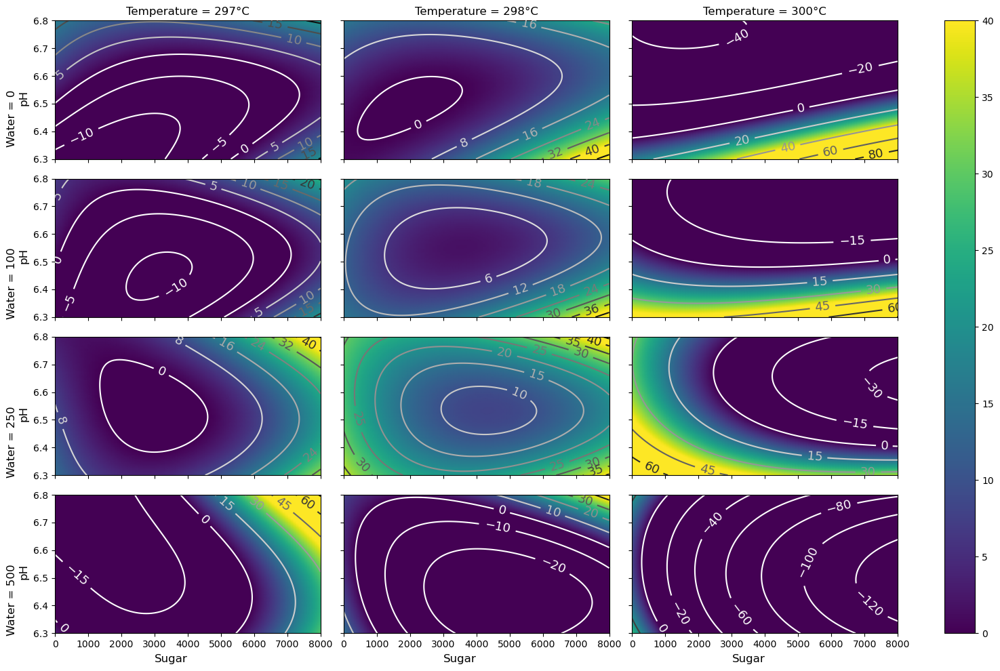

c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)
===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


===========r==============
(10000, 83)
===========r==============
(10000, 83)


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


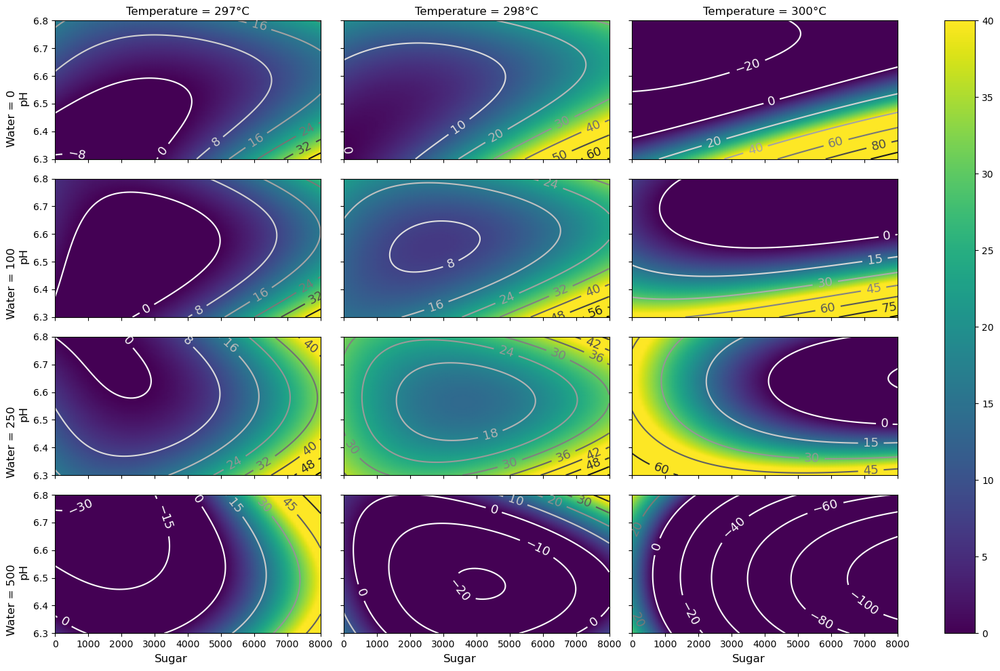

In [98]:
for i in [12.905,11.467,13.154,12.334]:
    for j in [61177]:
        counter_plot_ML(Dissolved_oxygen_concentration=i,Vessel_Volume=j)
        break

#### Check with SVM

In [93]:
# def counter_plot_ML(x_axis = 'Sugar_mass_flow',y_axis = 'Vessel_Volume', Sugar_mass_flow=[0,2.43],
#                  Dissolved_oxygen_concentration = 12.905,Vessel_Volume=75000,pH = [5.5,6.5]):
def counter_plot_SVM(x_axis = 'Sugar_mass_flow',y_axis = 'Vessel_Volume', Sugar_mass_flow=[0,8000],
                 Dissolved_oxygen_concentration = 12.905,Vessel_Volume=61177,pH = [6.3,6.8]):
    vs = np .array([0,100,250,500]) #Water for injection/dilution(Fw:L/h)
    us = np.array([297,298,300])  #Temperature(T:K)
    x_len, y_len = 100, 100        
    dis = [Dissolved_oxygen_concentration]*100
    sug = np.linspace(Sugar_mass_flow[0],Sugar_mass_flow[1], y_len)
    ve = [Vessel_Volume]*100#+[14]*20
    # Reac = np.zeros(100)
    ph = np.linspace(pH[0],pH[1], y_len)#RPM
   
    fig, axs = plt.subplots(nrows=4, ncols=3,      
                            sharex=True, sharey=True,   
                            clear=True,        
                            figsize=(15, 10))  

    for ax, v in zip(axs, vs): #vs Water for injection/dilution(Fw:L/h),axs : biểu đồ 
        count=0
        ax[0].set_ylabel('Water = '+str(v)+'\npH', size='large', ha='right', labelpad = 5)
        
        for u in us:# us: Temp
            if v == 0:
                ax[count].set_title("Temperature = " + str(u) + "°C")
            if v == 500:
                ax[count].set_xlabel('Sugar', size='large', ha='right', labelpad = 5)
            # ax[count].set_ylabel('RPM', size='large', ha='right', labelpad = 5)
            
            SUG_m,PH_m = np.meshgrid(sug,ph)#sug create 100 line (and 10000 points) for pet and ph
            ve_m = ve*np.ones_like(SUG_m)# create the same size of sug from pa
            dis_m = dis*np.ones_like(SUG_m)# create the same size of sug from pa
            
            vm = v * np.ones_like(SUG_m)
            um = u * np.ones_like(SUG_m)
            r = np.c_[SUG_m.flatten(),vm.flatten(), dis_m.flatten(), ve_m.flatten(),PH_m.flatten(),um.flatten()]
            print('==================r===============:',r)
            r = scaled.transform(r)
            # r become database with 10000 line and with the columns name above (all features)
                 
            c = svm.predict(r).reshape(x_len, y_len)
    
            cmap = ax[count].contour(SUG_m, PH_m, c, vmin=0, vmax = np.max(c), cmap='gray_r')# for loop Water for injection/dilution(Fw:L/h) and for loop temp
            # finish loop we get 12 sub charts
            plt.clabel(cmap, inline=1, fontsize=13)
            pmap = ax[count].pcolormesh(SUG_m, PH_m, c, 
                        shading='gouraud',
                        vmin=0, vmax=40, 
                        cmap='viridis')
            count += 1

    plt.tight_layout()
    plt.colorbar(pmap, ax=axs, fraction=0.05)
    plt.savefig('.\img_SVM\\'+str(Dissolved_oxygen_concentration)+'_'+str(Vessel_Volume)+'.png')
    plt.show()

==================r===============: [[0.00000000e+00 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 0.00000000e+00 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 1.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 2.50000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 5.00000000e+02 1.29050000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


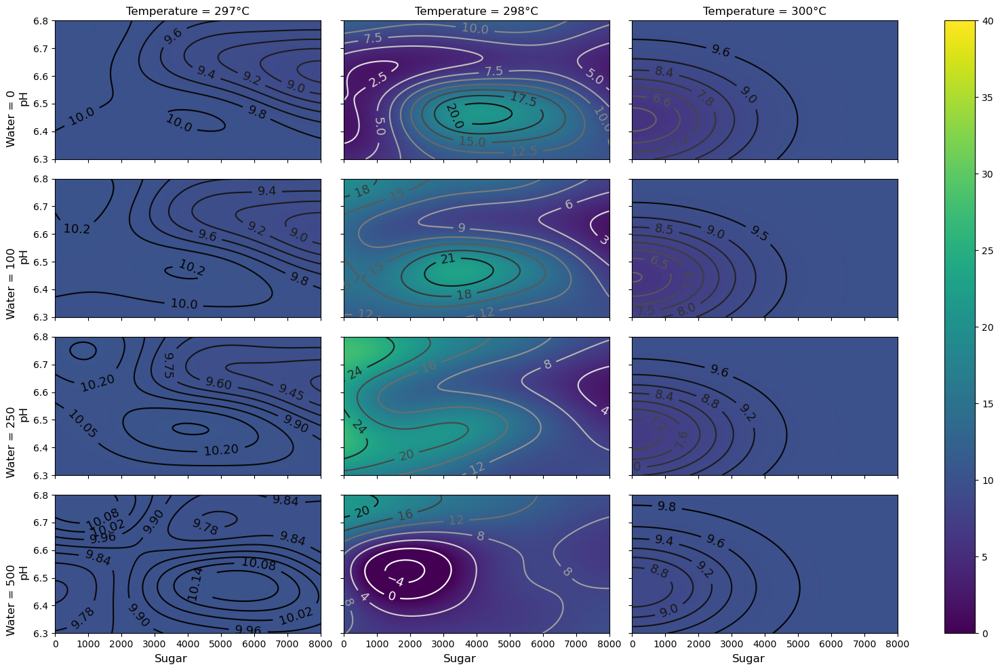

==================r===============: [[0.00000000e+00 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 0.00000000e+00 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 1.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 2.50000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 5.00000000e+02 1.14670000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


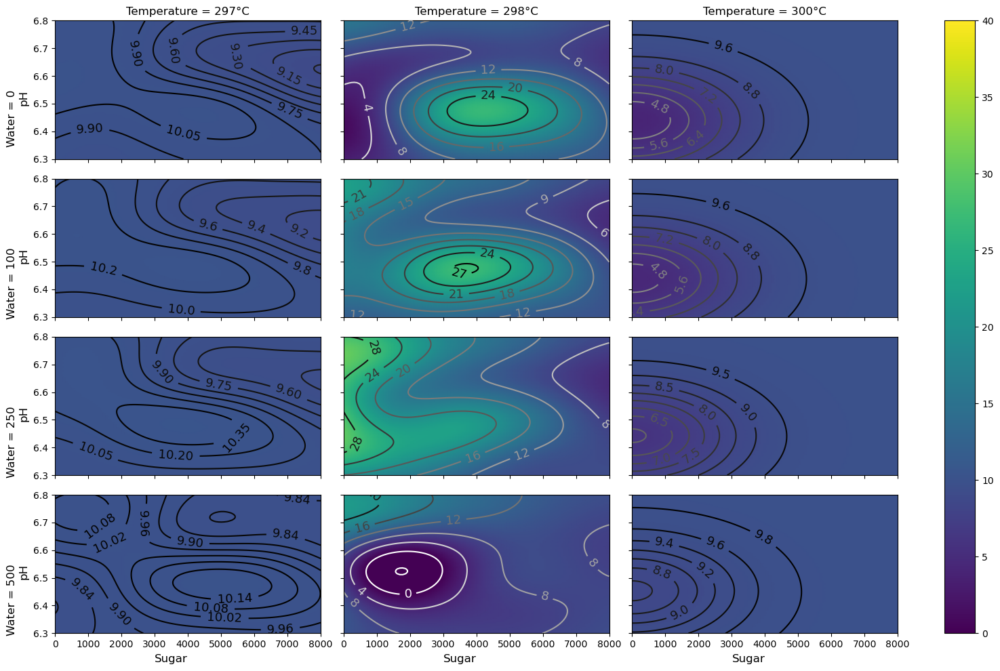

==================r===============: [[0.00000000e+00 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 0.00000000e+00 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 1.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 2.50000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 5.00000000e+02 1.31540000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


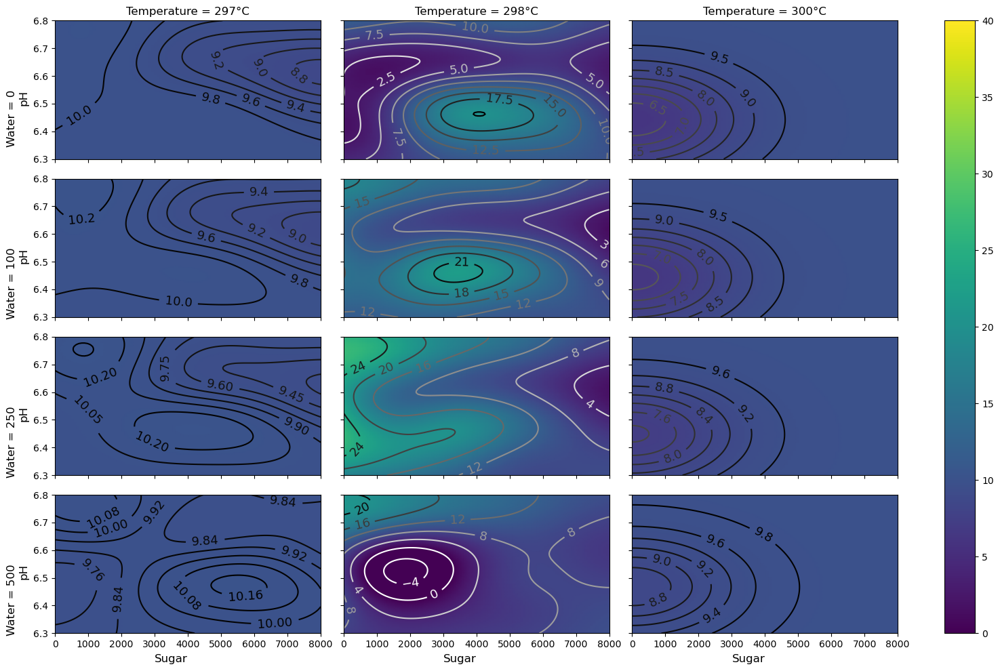

==================r===============: [[0.00000000e+00 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 0.00000000e+00 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 1.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 2.50000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [8.08080808e+01 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 [1.61616162e+02 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.97000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [7.91919192e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]
 [8.00000000e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.97000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [8.08080808e+01 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 [1.61616162e+02 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 2.98000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [7.91919192e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]
 [8.00000000e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 2.98000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


==================r===============: [[0.00000000e+00 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [8.08080808e+01 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 [1.61616162e+02 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.30000000e+00 3.00000000e+02]
 ...
 [7.83838384e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [7.91919192e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]
 [8.00000000e+03 5.00000000e+02 1.23340000e+01 6.11770000e+04
  6.80000000e+00 3.00000000e+02]]


c:\Users\thanh\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


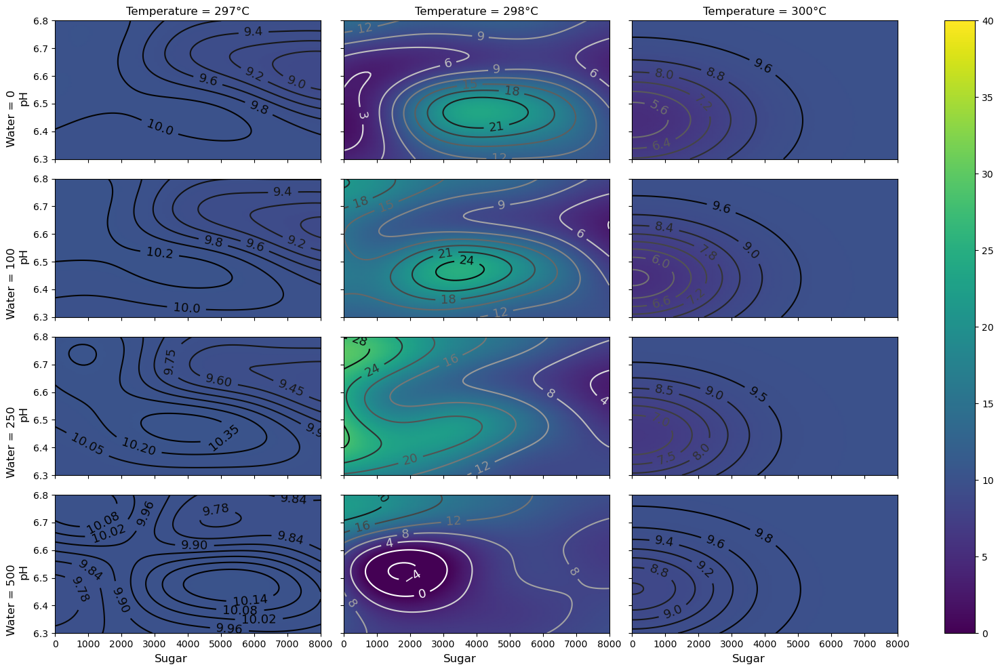

In [94]:
for i in [12.905,11.467,13.154,12.334]:
    for j in [61177]:
        counter_plot_SVM(Dissolved_oxygen_concentration=i,Vessel_Volume=j)
        break

#  
                                                             🎉🎉HAPPY NEW YEAR 🎉🎉